## RECOMMENDATION ENGINES - GROUP ASSIGNMENT 

#### Group E -  IE Global Masters - 2nd Term

**Members:** 

- Nalisha Men | nalisha.m@student.ie.edu | 

- Ramón Denia Chávarri | deniachavarri@student.ie.edu | 

- Disha Saxena | disha.saxena@student.ie.edu |
- Jan Phillip Thoma | janphillip.thoma@student.ie.edu | 
- Elias Theodoropoulos  | e.theodoropoulos@student.ie.edu | 


#### Required Libraries

There are quite a few libraries and toolkits in Python that we will need to install/import to be able to complete the inputs of these notebool and see the potential of this recommender system.

We are going to use the following libraries:

- [Pandas](https://pandas.pydata.org/docs/) --> Pandas is an open source, BSD-licensed library providing high-performance, easy-to-use data structures and data analysis tools for the Python programming language.
- [Gzip](https://docs.python.org/3/library/gzip.html) --> This module provides a simple interface to compress and decompress files just like the GNU programs gzip and gunzip would.
- [SimpleJson](https://docs.python.org/3/library/json.html) --> This library will allow as to decode the csv from Amazon Database. 
- [Plotly](https://plotly.com/python/) --> Plotly's Python graphing library makes interactive, publication-quality graphs. 
- [Surprise](https://github.com/NicolasHug/Surprise)--> Surprise is a Python SciKit that comes with various recommender algorithms and similarity metrics to make it easy to build and analyze recommenders.

**Note:** If you need to install any library don't forget to use the following notation: *! pip install -library-*

In [1]:
#!pip3 install simplejson
#pip install simplejson
import pandas as pd
import gzip
import simplejson as json

In [2]:
def parse(path):
    g = gzip.open(path, 'rb')
    for l in g:
        yield json.loads(l)

def getDF(path):
    i = 0
    df = {}
    for d in parse(path):
        df[i] = d
        i += 1
    return pd.DataFrame.from_dict(df, orient='index')

core = getDF('Video_Games.json.gz')
#core=movies.columns = ['itemID', 'title']
meta = getDF('meta_Video_Games.json.gz')

In [3]:
#Creating own rating scheme from Video_Games data, with True value for the verified columns
rawrating=core[core.verified==True][['overall','reviewerID','asin']]
rawrating.columns = ['rating','userID', 'itemID']

#rating=pd.read_csv('Video_Games.csv',header=None)
#rating.columns = ['itemID', 'userID', 'rating', 'timestamp']

In [4]:
games=meta[meta.main_cat=='Video Games'][['asin','title']]
games.columns = ['itemID', 'title']

df = pd.merge(rawrating, games, on='itemID', how='inner')[['userID','title','rating']]
#Remove 0.9% rows of duplicates
df=df.drop_duplicates(keep='last')

In [5]:
df.isnull().sum()
#df does not have any missing information

userID    0
title     0
rating    0
dtype: int64

In [6]:
print('Dataset shape: {}'.format(df.shape))
print('-Dataset examples-')
print(df.iloc[::10000, :])

Dataset shape: (1521260, 3)
-Dataset examples-
                 userID                                              title  \
0        A21ROB4YDOZA5P  BRAND NEW Learning Company Oregon Trail 5th Ed...   
15567     AYPRCAREAN28M                      WarCraft 2 Battle.net Edition   
35591     A9UIJQQ4C1ADK                                        Ms. Pac-Man   
55611     A7Q7W0TW0TT2D                                        Banjo-Tooie   
75621     AOEWOUVC8JL3V                                Super Mario Advance   
...                 ...                                                ...   
1634559   AYRP4DI2UYDAB  eForCity&reg; 5 Pack Black Rechargeable 3600mA...   
1644753   A7EJUSP1PQ4MG  Gameboy Color Pokemon/pikachu Edition Blue Bat...   
1654839   A209DZPUI9FS3                         Saitek J22G P750 Pad (USB)   
1664899  A1LCOM8TMK1SC9        The Sims 4 Get Together :  [Instant Access]   
1674938  A3A663YR1FE9HV  Gam3Gear Wired Controller Gamepad for Original...   

         rating 

## Part 1.Analyze the data

>Check the rating data and perform stratified sampling based on rating proportion.

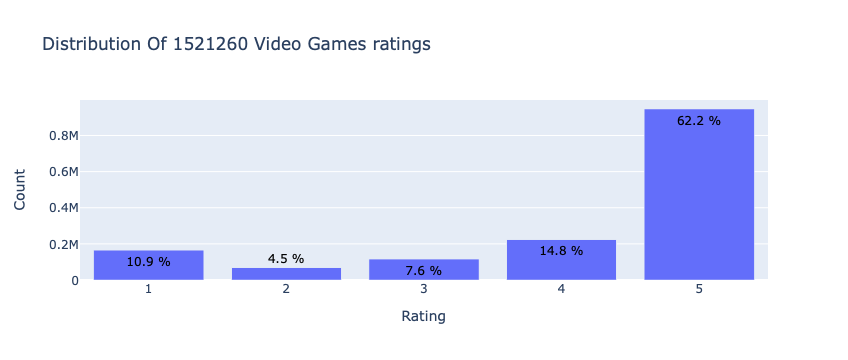

In [7]:
import plotly
from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)

# Count the number of times each rating appears in the dataset
data = df['rating'].value_counts().sort_index(ascending=False)

# Create the histogram
trace = go.Bar(x = data.index,
               text = ['{:.1f} %'.format(val) for val in (data.values / df.shape[0] * 100)],
               textposition = 'auto',
               textfont = dict(color = '#000000'),
               y = data.values,
               )
# Create layout
layout = dict(title = 'Distribution Of {} Video Games ratings'.format(df.shape[0]),
              xaxis = dict(title = 'Rating'),
              yaxis = dict(title = 'Count'))
# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

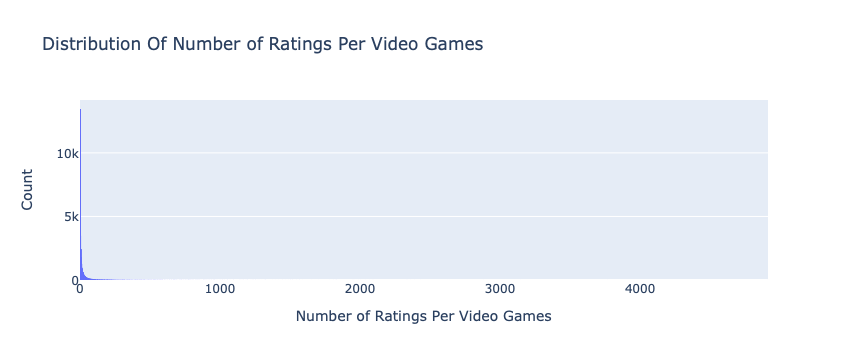

In [8]:
# Number of ratings per Video Games
data = df.groupby('title')['rating'].count()

# Create trace
trace = go.Histogram(x = data.values,
                     name = 'Ratings',
                     xbins = dict(start = 0,size = 2))
# Create layout
layout = go.Layout(title = 'Distribution Of Number of Ratings Per Video Games',
                   xaxis = dict(title = 'Number of Ratings Per Video Games'),
                   yaxis = dict(title = 'Count'),
                   bargap = 0.2)

# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

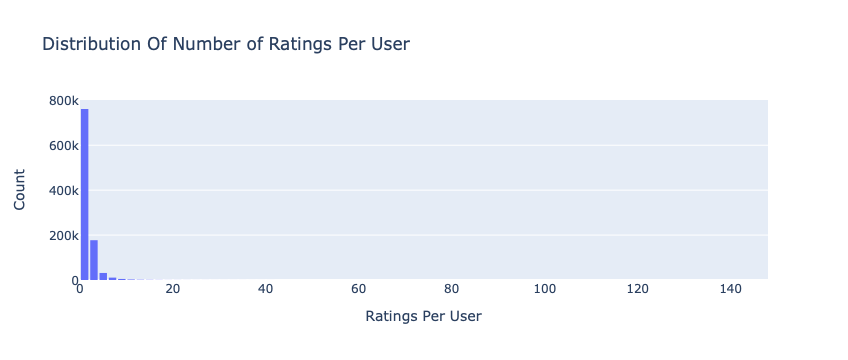

In [9]:
# Number of ratings per user
data = df.groupby('userID')['rating'].count()

# Create trace
trace = go.Histogram(x = data.values,
                     name = 'Ratings',
                     xbins = dict(start = 0, size = 2))
# Create layout
layout = go.Layout(title = 'Distribution Of Number of Ratings Per User',
                   xaxis = dict(title = 'Ratings Per User'),
                   yaxis = dict(title = 'Count'),
                   bargap = 0.2)

# Create plot
fig = go.Figure(data=[trace], layout=layout)
iplot(fig)

## Part 2. Collaborative Filtering
> * Prepare the original dataset with a smaller dataset
> * Benchmarking through several models available in surprise
> * Select two best performing models and perform gridsearch to tune the parameters
> * Interpret the results

In [10]:
#Stratified the dataset porportionally according to ratings
import numpy as np
N = 60000
sample=df.groupby('rating', group_keys=False).apply(lambda x: x.sample(int(np.rint(N*len(x)/len(df))))).sample(frac=1).reset_index(drop=True)

In [11]:
from surprise import Dataset
from surprise import Reader

reader = Reader(rating_scale=(1, 5))
data = Dataset.load_from_df(sample[['userID', 'title', 'rating']], reader=reader)
#data.split(n_folds=5)

#### Benchmarking

In [12]:
#Benchmarking
from surprise import SVD,SVDpp
from surprise import Dataset,SVD,NormalPredictor
from surprise import BaselineOnly
from surprise import NMF
from surprise import SlopeOne
from surprise import CoClustering
from surprise import KNNBaseline
from surprise.model_selection import cross_validate
benchmark = []
# Iterate over all algorithms
for algorithm in [SVD(), SVDpp(), SlopeOne(), NMF(), NormalPredictor(), KNNBaseline(), BaselineOnly(), CoClustering()]:
    
    print("Testing {}".format(algorithm))
    # Perform cross validation
    results = cross_validate(algorithm, data, measures=['RMSE'], cv=3, verbose=False)
    
    # Get results & append algorithm name
    tmp = pd.DataFrame.from_dict(results).mean(axis=0)
    tmp = tmp.append(pd.Series([str(algorithm).split(' ')[0].split('.')[-1]], index=['Algorithm']))
    benchmark.append(tmp)
    
pd.DataFrame(benchmark).set_index('Algorithm').sort_values('test_rmse')    

Testing <surprise.prediction_algorithms.matrix_factorization.SVD object at 0x7f8f9ad84d60>
Testing <surprise.prediction_algorithms.matrix_factorization.SVDpp object at 0x7f8f9ad84e80>
Testing <surprise.prediction_algorithms.slope_one.SlopeOne object at 0x7f8f9ad84e20>
Testing <surprise.prediction_algorithms.matrix_factorization.NMF object at 0x7f8f9ad84eb0>
Testing <surprise.prediction_algorithms.random_pred.NormalPredictor object at 0x7f8f9ad84ee0>
Testing <surprise.prediction_algorithms.knns.KNNBaseline object at 0x7f8f9ad84f70>
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Testing <surprise.prediction_algorithms.baseline_only.BaselineOnly object at 0x7f8f9ad84fd0>
Estimating biases using als...
Estimating biases using als

,test_rmse,fit_time,test_time
Algorithm,,,
KNNBaseline,1.324615,109.859480,0.655280
SVD,1.324626,3.441992,0.153097
SVDpp,1.325251,4.580033,0.170217
BaselineOnly,1.325262,0.412664,0.140394
SlopeOne,1.362121,9.314139,0.291664
CoClustering,1.364434,5.985178,0.132717
NMF,1.375647,8.082184,0.791059
NormalPredictor,1.730011,0.088111,0.383728


#### Tune SVD

In [13]:
from surprise import SVD
from surprise import Dataset
from surprise.model_selection import cross_validate

# Use the famous SVD algorithm
algo = SVD()

# Run 5-fold cross-validation and then print results
cross_validate(algo, data, measures=['RMSE', 'MAE'], cv=3, verbose=True)


Evaluating RMSE, MAE of algorithm SVD on 3 split(s).

                  Fold 1  Fold 2  Fold 3  Mean    Std     
RMSE (testset)    1.3273  1.3221  1.3231  1.3242  0.0023  
MAE (testset)     1.0427  1.0354  1.0377  1.0386  0.0031  
Fit time          3.11    3.10    3.08    3.10    0.01    
Test time         0.15    0.14    0.13    0.14    0.01    


{'test_rmse': array([1.32733125, 1.32213939, 1.32311687]),
 'test_mae': array([1.04269887, 1.03538244, 1.0376658 ]),
 'fit_time': (3.1115829944610596, 3.0973360538482666, 3.079185962677002),
 'test_time': (0.14525103569030762, 0.13634395599365234, 0.13169479370117188)}

In [14]:
#Gridsearch for svd
from surprise import Dataset,SVD,NormalPredictor
from surprise.model_selection import GridSearchCV
param_grid = {'n_factors': [50,100,150,200],
              'n_epochs': [20,30,50], 
              'lr_all': [0.005,0.01],
              'reg_all':[0.02,0.1]}

gs = GridSearchCV(SVD, param_grid, measures=['rmse'], cv=3)
gs.fit(data)
params = gs.best_params['rmse']
svdtuned = SVD(n_factors=params['n_factors'], n_epochs=params['n_epochs'],lr_all=params['lr_all'], reg_all=params['reg_all'])


In [15]:
cross_validate(svdtuned, data, measures=['RMSE', 'MAE'], cv=3, verbose=True)

Evaluating RMSE, MAE of algorithm SVD on 3 split(s).

                  Fold 1  Fold 2  Fold 3  Mean    Std     
RMSE (testset)    1.3146  1.3235  1.3301  1.3227  0.0064  
MAE (testset)     1.0308  1.0372  1.0380  1.0353  0.0032  
Fit time          5.98    5.98    5.99    5.99    0.00    
Test time         0.14    0.13    0.13    0.13    0.00    


{'test_rmse': array([1.31457947, 1.3235293 , 1.33010367]),
 'test_mae': array([1.03075913, 1.03715872, 1.03796528]),
 'fit_time': (5.983756065368652, 5.984936952590942, 5.992956161499023),
 'test_time': (0.13596630096435547, 0.13126087188720703, 0.1330277919769287)}

#### Tune KNNBaseline

In [16]:
from surprise import KNNBaseline
from surprise.model_selection import cross_validate

# To use item-based cosine similarity
sim_options = {
    "name": "cosine",
    "user_based": False,  # Compute  similarities between items
}
knn = KNNBaseline(sim_options=sim_options)


results = cross_validate(knn, data, measures=['RMSE'], cv=3, verbose=True)

Estimating biases using als...
Computing the cosine similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the cosine similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the cosine similarity matrix...
Done computing similarity matrix.
Evaluating RMSE of algorithm KNNBaseline on 3 split(s).

                  Fold 1  Fold 2  Fold 3  Mean    Std     
RMSE (testset)    1.3291  1.3196  1.3277  1.3255  0.0042  
Fit time          7.16    6.52    6.82    6.83    0.26    
Test time         0.17    0.16    0.15    0.16    0.01    


In [17]:
from surprise import KNNBaseline
from surprise.model_selection import GridSearchCV

sim_options = {
    "name": ["msd", "cosine"],
    "min_support": [3, 4, 5],
    "user_based": [False, True],
}

param_grid = {"sim_options": sim_options}

gs = GridSearchCV(KNNBaseline, param_grid, measures=["rmse", "mae"], cv=3)
gs.fit(data)

print(gs.best_score["rmse"])
print(gs.best_params["rmse"])

Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.
Estimating biases using als...
Computing the msd similarity matr

In [18]:
# To use tuned 
sim_options = {'name': 'msd', 'min_support': 3, 'user_based': False}
knn_tuned = KNNBaseline(sim_options=sim_options)


#### Interpretation

In [43]:
trainset = data.build_full_trainset()
knn_tuned.fit(trainset)

# Target movie to analyze its neighbourhood
#video_game = 'Call of Duty: Ghosts Prestige Edition - Xbox One'
video_game='The LEGO Movie Videogame - Xbox 360 Standard Edition'
#video_game='The Last of Us Remastered - PlayStation 4'
# Get the closes neighbourds
neighbors = knn_tuned.get_neighbors(knn_tuned.trainset.to_inner_iid(video_game), k=10)
# Translate the internal ids used in the algorithm to the movie names
neighbors = (knn_tuned.trainset.to_raw_iid(inner_id) for inner_id in neighbors)

print()
print('The 10 nearest neighbors of {} are:\n'.format(video_game))
for games in neighbors:
    print("\t",games)

Estimating biases using als...
Computing the msd similarity matrix...
Done computing similarity matrix.

The 10 nearest neighbors of The LEGO Movie Videogame - Xbox 360 Standard Edition are:

	 Sonic Heroes - PlayStation 2
	 Killer Instinct: Definitive Edition - Xbox One
	 HDE Torx T8 Star Tamper Proof Screwdriver for Xbox Game Consoles Tablets Laptops PC 2.31mm
	 Microsoft Kinect Sports Rivals Xbox One English US / 5TW-00001
	 Luxor: Pharaoh's Challenge - Sony PSP
	 Forza Horizon 3 Ultimate Edition - Xbox One/Windows 10 [Digital Code]
	 PlayStation Vita - Wifi
	 Old Skool Xbox One Play and Charge Kit Rechargeable Battery Pack w/ USB Charging Cable for wireless controller.
	 Xbox 360 6 in 1 Bundle - Black
	 8' Component A/V Cable Wii


In [20]:
from sklearn.preprocessing import StandardScaler
x = StandardScaler().fit_transform(svdtuned.qi)

from sklearn.decomposition import PCA
pca = PCA(n_components=3)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3'])

In [21]:
for row in principalDf.sort_values(by='principal component 1', ascending=False).head(10).iterrows():
    print("VideoGames: {} with PC value = {}".format(trainset.to_raw_iid(row[0]), row[1][0]))

VideoGames: The Sims 4 Spa Day [Online Game Code] with PC value = 4.635812823583758
VideoGames: Kinect Rush: A Disney Pixar Adventure - Xbox 360 with PC value = 4.23479450706034
VideoGames: Bully - PS3 [Digital Code] with PC value = 4.066034116513527
VideoGames: FIFA Manager 12 [Download] with PC value = 4.048866582888371
VideoGames: Tiger Woods PGA TOUR 13: The Masters Collector's Edition - Xbox 360 (Collector's Edition) with PC value = 4.044012978209779
VideoGames: Spongebob Surf &amp; Skate Roadtrip - Xbox 360 with PC value = 3.9488401360513214
VideoGames: Rise of the Tomb Raider - Xbox One with PC value = 3.9080490949231184
VideoGames: Nintendo Wii Console (Black) - (Certified Refurbished) with PC value = 3.836389847650049
VideoGames: Teen Titans - Gamecube with PC value = 3.753167250692717
VideoGames: Amazing Adventures: The Lost Tomb - PC with PC value = 3.746729010100686


In [22]:
for row in principalDf.sort_values(by='principal component 2', ascending=False).head(10).iterrows():
    print("VideoGames: {} with PC value = {}".format(trainset.to_raw_iid(row[0]), row[1][1]))

VideoGames: The Sims 3 Pets [Download] with PC value = 5.788290201121121
VideoGames: New Super Mario Bros. U + New Super Luigi U - Wii U with PC value = 4.494284728020137
VideoGames:  Generic New Wired Infrared Sensor Bar for Nintendo Wii Controller with PC value = 4.335200130261889
VideoGames: The Sims 4 Spa Day [Online Game Code] with PC value = 4.24207041611255
VideoGames: The Sims 3 Deluxe [Download] with PC value = 4.001737972722332
VideoGames: Xbox One + Kinect with PC value = 3.8409693564036407
VideoGames: Dukes of Hazzard: Return of the General Lee - PlayStation 2 with PC value = 3.791557492887896
VideoGames: Call of Juarez: Bound in Blood - PC with PC value = 3.7573070577871106
VideoGames: Madden NFL 2001 with PC value = 3.5989947628115306
VideoGames: HORI Racing Wheel 4 for PlayStation 3 and 4 with PC value = 3.4874199875322844


In [23]:
for row in principalDf.sort_values(by='principal component 3', ascending=False).head(10).iterrows():
    print("VideoGames: {} with PC value = {}".format(trainset.to_raw_iid(row[0]), row[1][2]))

VideoGames: NCIS - Nintendo Wii with PC value = 6.116968283089097
VideoGames: PSP 9 in 1 Gamer Pack with PC value = 3.9861341911276957
VideoGames: PS4 USB Hub 5 Port USB 3.0 2.0 High Speed Expansion Hub Charger Controller Adapter Connector for Sony Playstation 4 PS4 Gaming Console [Playstation 4] with PC value = 3.951661668026871
VideoGames: for BenQ LITE-ON DG-16D2S HOP-141X HOP-141B HOP-14XX DVD Laser Lens for XBOX 360 with PC value = 3.8520760907637555
VideoGames: Terminator 3: Rise of the Machines (PS2) with PC value = 3.8506521532817497
VideoGames: Star Wars Galaxies: The Total Experience - PC with PC value = 3.7606544984078893
VideoGames: Area 51 - Sega Saturn with PC value = 3.641271178613614
VideoGames: Thinksmart - Family - Nintendo Wii with PC value = 3.529730313122423
VideoGames: Disney INFINITY: Marvel Super Heroes (2.0 Edition) Power Disc - Infinity Gauntlet with PC value = 3.5025949202397233
VideoGames: Need for Speed - Deluxe Edition - Xbox One with PC value = 3.50202146

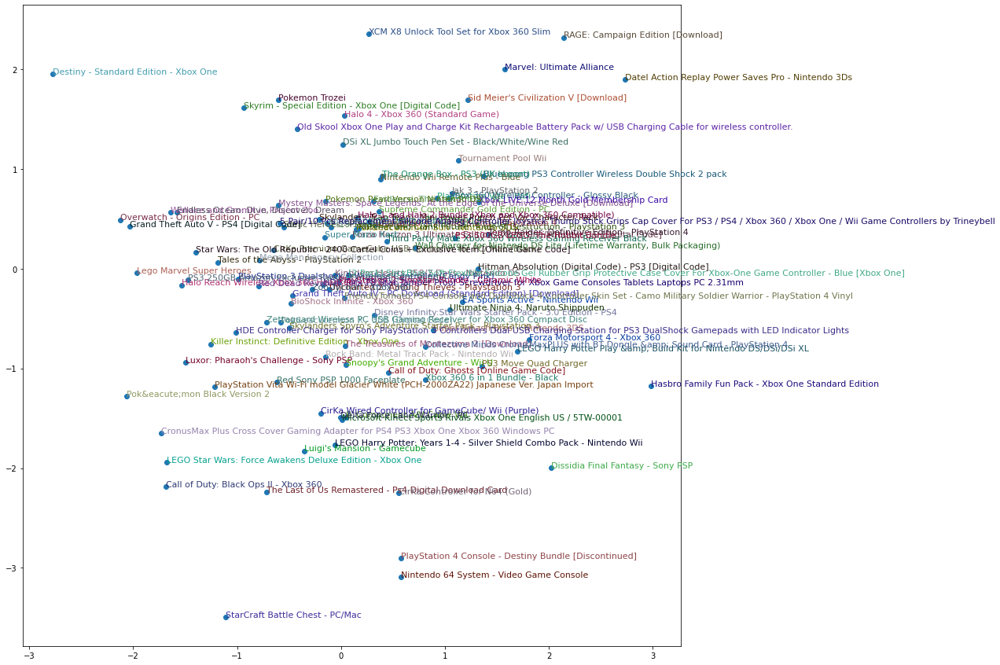

In [24]:
import matplotlib.pyplot as plt
import numpy as np

# Taking randomly just 100 movies to avoid overcrowding the plot
idxs = np.random.choice(len(principalDf), 100, replace=False) 
idxs = list(range(100))

# Represent the movies according to the principal components
X = principalDf.iloc[idxs]['principal component 1'].values
Y = principalDf.iloc[idxs]['principal component 3'].values

# Plot the movies
plt.figure(figsize=(15,15))
plt.scatter(X, Y)
for i, x, y in zip([trainset.to_raw_iid(idx) for idx in idxs], X, Y):
    plt.text(x,y,i, color=np.random.rand(3)*0.7, fontsize=11)
plt.show()

## Part 3: Content-based
#### Creating a TF-IDF Vectorizer


For the feature extraction, we will use TF-IDF and the implementation that sklearn provides (https://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html). By using sklearn, we will automatize the computation of TF-IDF, so we do not need to worry about it. Additionally, we will get the data in a format that is already usable for any ML or recommendation algorithm.

Clean the text with the following methods:
- stemming
- html and unicode data removal

There are several parameters that we can use to configure the computation of TF-IDF:
- ngram_range: It allows you to consider n-grams additionally to individual words
- min_df: Sets a frequency threshold=0.01
- stopwords: Removes stopwords

In [25]:
ds=meta[meta.main_cat=='Video Games'][['asin','description','title']]
ds.columns = ['itemID', 'description','title']

In [26]:
ds_sample=ds.sample(1000)

In [27]:
#Keep only one title as there are different itemID associated with same description and titles.
title=ds_sample['title'].value_counts().to_dict()
for a,b in title.items():
    if b!=1:
        index_names = ds_sample[(ds_sample['title'] == a)].index
        ds_sample.drop(index_names, inplace = True)

In [28]:
#Clean "description" : remove "[" and "]", remove html and unicode, such as "\xa0"
ds_sample['description'] = [''.join(map(str, x)) for x in ds_sample['description']]

def clean_description(text):
    from bs4 import BeautifulSoup
    import lxml.html
    import lxml.html.clean
    if bool(BeautifulSoup(text, "html.parser").find()):
        doc = lxml.html.fromstring(text)
        cleaner = lxml.html.clean.Cleaner(style=True)
        doc = cleaner.clean_html(doc)
        text = doc.text_content()
    elif text.__contains__('\xa0'):
        import unicodedata
        text = unicodedata.normalize("NFKD", text)
    #To normalize the words based on stemming
    import nltk
    from nltk.stem.porter import PorterStemmer
    from nltk.stem import WordNetLemmatizer
    stemmer = PorterStemmer()
    text=stemmer.stem(text)
    #text = " ".join([word for word in text.split() if word not in stop_words])
    return text


In [29]:
'''
for a in range(ds['description'].shape[0]):
    text=ds['description'][a]
    ds['description'][a]=clean_description(text)
'''
ds_sample['description']=ds_sample['description'].apply(clean_description)

In [30]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(ngram_range=(1,1), analyzer='word', min_df=0.01, max_features=5000, stop_words='english')
tfidf_matrix = tfidf.fit_transform(ds_sample['description'])

In [31]:
feature_names = tfidf.get_feature_names()
df_tfidf = pd.DataFrame(tfidf_matrix.todense(), columns=feature_names)
df_tfidf

,000,10,100,11,12,13,15,16,1999,20,...,world,worlds,writing,written,wrong,xbox,xp,year,years,young
0,0.0,0.0,0.069459,0.091306,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0
1,0.0,0.0,0.000000,0.000000,0.048426,0.0,0.0,0.000000,0.026625,0.023609,...,0.000000,0.0,0.0,0.024432,0.0,0.0,0.000000,0.138409,0.059873,0.0
2,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0
3,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.129354,0.0,0.0,0.000000,0.0,0.0,0.073772,0.000000,0.000000,0.0
4,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.159720,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
983,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0
984,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0
985,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,...,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0
986,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.087643,0.000000,0.000000,...,0.150495,0.0,0.0,0.000000,0.0,0.0,0.085829,0.000000,0.000000,0.0


In [32]:
dict(df_tfidf.sort_values(by=1, ascending=False, axis=1).iloc[1])

{'ships': 0.33777488908306386,
 'game': 0.25426749375316093,
 'space': 0.2504970788015765,
 'mission': 0.23894029233887917,
 'original': 0.21490098031218594,
 'multiplayer': 0.18647536870638184,
 'ship': 0.17982567257960835,
 'sim': 0.16929881728629884,
 'interface': 0.15974966628521037,
 'missions': 0.1511435048970995,
 'war': 0.14036383391368532,
 'events': 0.13945259703839732,
 'resolution': 0.13884990221468857,
 'year': 0.1384088250180954,
 'games': 0.12860467873648124,
 'impressive': 0.1128658781908659,
 'fighters': 0.1128658781908659,
 'weapons': 0.11188522122382911,
 'craft': 0.10943700112713287,
 'plenty': 0.10943700112713287,
 'plot': 0.10791589419658387,
 'best': 0.09183147281547047,
 'genre': 0.09031625609605272,
 'graphics': 0.08802346991348127,
 'addition': 0.0868873790323197,
 'battles': 0.08536627210177068,
 'editor': 0.08464940864314942,
 'new': 0.08295462694569469,
 'pilot': 0.07987483314260518,
 '32': 0.07987483314260518,
 'released': 0.0754462084466001,
 'gamespot': 

#### Cosine Similarity

In [33]:
from sklearn.metrics.pairwise import linear_kernel 

# Compute cosine similarity
cosine_similarities = linear_kernel(tfidf_matrix, tfidf_matrix)
#Reset ds index
ds_sample=ds_sample.reset_index()

# Iterate over the items in the dataset to find the most similar ones to each one
results = {}
for idx, row in ds_sample.iterrows():
    similar_indices = cosine_similarities[idx].argsort()[:-100:-1] 
    similar_items = [(cosine_similarities[idx][i], ds_sample['itemID'][i]) for i in similar_indices] 
    results[row['itemID']] = similar_items[1:]

In [34]:
def item(id):  
    return ds.loc[ds['itemID'] == id]['title'].tolist()[0].split(' - ')[0] 

# Just reads the results out of the dictionary
def recommend(item_id, num):
    print("Recommending " + str(num) + " video games similar to " + item(item_id) + "...")   
    print("-------")
    recs = results[item_id][:num]   
    for rec in recs: 
        print(" - " + item(rec[1]) + " (score:" +      str(rec[0]) + ")")

In [41]:
ds_sample[ds_sample['title'].str.contains("LEGO")][['title','itemID']]

,title,itemID
666,The LEGO Movie Videogame - Xbox 360 Standard E...,B00ECOBFA4
793,LEGO Star Wars: The Force Awakens - Xbox One D...,B01EBHZVP6


In [42]:
recommend(item_id='B00ECOBFA4', num=10)

#'B000TTFLS8'

Recommending 10 video games similar to The LEGO Movie Videogame...
-------
 - World of Warcraft Account + Diablo 3 + Hearthstone Beta (score:0.162575463894203)
 - Jewel Quest: The Sapphire Dragon [Download] (score:0.14964345665723167)
 - The Lord of the Rings: The Two Towers (score:0.14840753977670212)
 - Bensussen Deutsch Xbox One Mini Series Wired Controller Neon Edition CPFA115320-01 (score:0.14254379461127237)
 - Darkstone (Jewel Case) (score:0.14216091044746273)
 - Alvin and the Chipmunks (score:0.14204619234883606)
 - Monster Trucks (score:0.14045879436860395)
 - Ceville (score:0.13403405737874702)
 - Resident Evil 4 (score:0.13332520476003118)
 - IGT Slots Wild Wolf Mac [Download] (score:0.12290553588862238)
